In [1]:
!python3 train.py --dataset_df_dir data/ --splits_filename dataset_train.csv dataset_val.csv dataset_test.csv --text_col full_text_proc --y_col censored --class_weight automatic --seed 42 --model_save_dir models/ --log_dir log/ --iter_time_span 1000 --csv_output_path output/roberta-base-proc-new.csv --pretrained_model roberta-base --n_epochs 2 --output_type binary --lr 1e-5

Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'lm_head.layer_norm.bias', 'lm_head.dense.bias', 'lm_head.decoder.weight', 'lm_head.dense.weight', 'roberta.pooler.dense.weight', 'lm_head.bias', 'lm_head.layer_norm.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.out_proj.weight', 'classi

In [ ]:
!pip install shap

In [10]:
%load_ext autoreload
%autoreload 2
import pandas as pd
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import torch
import transformers
import shap
import pickle
np.random.seed(seed=0)

In [2]:
def select_df(df, lang='en', withheld='DE', exclude_fully_blocked_users=False, only_include_fully_blocked_users=False, exclude_certain_retweet_targets=None):
    if withheld is not None:
        new_df = df[df['withheld'].fillna('').str.contains(f"'{withheld}'")]
    else:
        new_df = df
    new_df = new_df.loc[new_df['lang'] == lang]

    if exclude_fully_blocked_users:
        import pandas as pd
        user_df = pd.read_csv('/home/public/twitter_politics/censorship/data/paper_data/users.csv')
        new_df = new_df[~new_df['author_id'].isin(user_df['id'].values.tolist())]
        return new_df
    
    if only_include_fully_blocked_users:
        # an author_id list
        new_df = new_df[new_df['author_id'].isin(only_include_fully_blocked_users)]

        return new_df
    
    if exclude_certain_retweet_targets:
        for exclude_target in exclude_certain_retweet_targets:
            new_df = new_df[~new_df['text'].str.contains(f"RT @{exclude_target}")]

    return new_df

https://shap-lrjball.readthedocs.io/en/latest/example_notebooks/general/Explainable%20AI%20with%20Shapley%20Values.html#Explaining-a-transformers-NLP-model

1. time matters
2. usernames generate spurious correlation
3. retweets are likely to be censored
4. 

In [2]:
data = pd.read_csv('/nfs/turbo/coe-vvh/ljr/Censorship/data/dataset_test_p_en.csv', engine='python')

In [4]:
tmp_df = data.sample(n=20, replace=False)
print(tmp_df['censored'].values, tmp_df['text_proc'].values)

[1 0 1 0 1 0 0 0 0 0 1 1 1 1 1 0 0 0 0 0] [' He was working for Kimse Yok mu International Relief. Helping everybody in need. Including Yemen '
 'Investigators say they are looking into ‘a person of interest’ in death of Evelyn Boswell  '
 'Poland where political correctness has no place &amp; people speak their minds.\n\nPolish Defense League will NOT allow Invaders to Harm Citizens! '
 "I don't want to hear a thing about he should've resisted because I'll pull up 2 videos of 1 guy running around butt naked chasing cops after murdering his family and another one when dude actually stole the police car and neither time did the cops even fire a single shot 🤬🤬🤬 "
 'We are entering dangerous times when politicians are allowed to treat the average American citizen like this.\n\nOur government has absolutely no respect for we the people.\n\nWe the people are just cattle to our government overlords. That needs to change.\n\n'
 "#OccupyOakland: footage shows police beating 'peaceful' Iraq war

In [6]:
from nltk import word_tokenize
word_tokenize("The Messenger (PBUH) said There are -- ""two blessings which many people waste: They are good health and the free time to do good. (Ibn Abbas RA)")

['The',
 'Messenger',
 '(',
 'PBUH',
 ')',
 'said',
 'There',
 'are',
 '--',
 'two',
 'blessings',
 'which',
 'many',
 'people',
 'waste',
 ':',
 'They',
 'are',
 'good',
 'health',
 'and',
 'the',
 'free',
 'time',
 'to',
 'do',
 'good',
 '.',
 '(',
 'Ibn',
 'Abbas',
 'RA',
 ')']

In [4]:
import transformers
import torch
import numpy as np
import scipy as sp
import shap
np.random.seed(seed=0)

use_cuda = False
if use_cuda:
    # load a BERT sentiment analysis model
    tokenizer = transformers.AutoTokenizer.from_pretrained("roberta-base")
    model = transformers.AutoModelForSequenceClassification.from_pretrained("roberta-base").cuda()

    model.load_state_dict(torch.load(
        '/nfs/turbo/coe-vvh/ljr/Censorship/models/20230219-03:24:33_binary_0.1_8_1e-05_adamw.pt'))
    model.eval()

    # define a prediction function
    def f(x):
        tv = torch.tensor([tokenizer.encode(v, pad_to_max_length=True, max_length=500) for v in x]).cuda()
        outputs = model(tv)[0].detach().cpu().numpy()
        scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
        val = sp.special.logit(scores[:,1]) # use one vs rest logit units
        return val

    # build an explainer using a token masker
    explainer = shap.Explainer(f, tokenizer)
else:
    # load a BERT sentiment analysis model
    tokenizer = transformers.AutoTokenizer.from_pretrained("roberta-base")
    model = transformers.AutoModelForSequenceClassification.from_pretrained("roberta-base")

    model.load_state_dict(torch.load(
        '/nfs/turbo/coe-vvh/ljr/Censorship/models/20230219-03:24:33_binary_0.1_8_1e-05_adamw.pt', map_location=torch.device("cpu")))
    model.eval()


    # define a prediction function
    def f(x):
        tv = torch.tensor([tokenizer.encode(v, pad_to_max_length=True, max_length=500) for v in x])
        outputs = model(tv)[0].detach().cpu().numpy()
        scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
        # val = sp.special.logit(scores[:,1]) # use one vs rest logit units
        # modify val
        val = scores[:, 1]
        return val

    # build an explainer using a token masker
    # explainer = shap.Explainer(f, tokenizer)
    explainer = shap.Explainer(f, shap.maskers.Text(r"\s"))

# explain the model's predictions on IMDB reviews
# shap_values = explainer(tmp_df['full_text_proc'].values.tolist())


Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.dense.weight', 'lm_head.bias', 'roberta.pooler.dense.weight', 'lm_head.decoder.weight', 'lm_head.layer_norm.bias', 'roberta.pooler.dense.bias', 'lm_head.dense.bias', 'lm_head.layer_norm.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.weight', 'classifie

In [5]:
x = ["#OccupyOakland: footage shows police", "Just voted Ken."]
tv = torch.tensor([tokenizer.encode(v, pad_to_max_length=True, max_length=500) for v in x])
outputs = model(tv)[0].detach().cpu().numpy()
outputs.shape, outputs

The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).


((2, 2),
 array([[ 2.540511 , -2.708328 ],
        [ 1.9681947, -2.0850103]], dtype=float32))

In [16]:
outputs

array([[ 2.826193  , -3.0338552 ],
       [ 0.9318833 , -0.77594143]], dtype=float32)

In [8]:
outputs.mean(0)

array([ 2.2543528, -2.3966691], dtype=float32)

In [6]:
scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
# val = sp.special.logit(scores[:,1]) # use one vs rest logit units

In [7]:
scores[:, 1]

array([0.00522616, 0.01707017], dtype=float32)

In [23]:
sp.special.logit(0.002843)

-5.860048397312748

In [18]:
scores

array([[0.997157  , 0.002843  ],
       [0.846554  , 0.15344608]], dtype=float32)

In [19]:
val

array([-5.8600483, -1.7078247], dtype=float32)

In [ ]:
explainer = shap.Explainer(f, shap.maskers.Text(tokenizer=word_tokenize))
shap_values = explainer(["#OccupyOakland: footage shows police", "Just voted Ken."])
shap.plots.text(shap_values)

In [13]:
explainer = shap.Explainer(f, np.array([['#OccupyOakland', ': ', 'footage ', 'shows ', 'police'], ['Just ', 'voted ', 'Ken', '.']]))
shap_values = explainer(["#OccupyOakland: footage shows police", "Just voted Ken."])
shap.plots.text(shap_values)

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


IndexError: tuple index out of range

In [4]:
shap_values = explainer(["#OccupyOakland: footage shows police", "Just voted Ken."])
shap.plots.text(shap_values)

Partition explainer: 3it [00:24, 12.05s/it]               


In [7]:
shap_values = explainer(["#OccupyOakland: footage shows police", "Just voted Ken."])
shap.plots.text(shap_values)

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a 

In [8]:
shap_values

.values =
array([array([-0.11471722, -0.06518626, -0.07829641, -0.06300406]),
       array([-0.03916093, -0.12668114, -0.14351787])], dtype=object)

.base_values =
array([0.32643011, 0.32643011])

.data =
(array(['#OccupyOakland: ', 'footage ', 'shows ', 'police'], dtype=object), array(['Just ', 'voted ', 'Ken.'], dtype=object))

In [9]:
from slicer import Slicer
new_shap_values = shap_values
new_shap_values._s = Slicer(
    data=np.array([np.array([-0.11471722, -0.06518626, -0.07829641])]),
    values=np.array([np.array([-0.03916093, -0.12668114])]))

In [10]:
shap.plots.text(new_shap_values)

AttributeError: Attribute 'output_names' does not exist.

In [8]:
# plot the first sentence's explanation
shap.plots.text(shap_values)

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


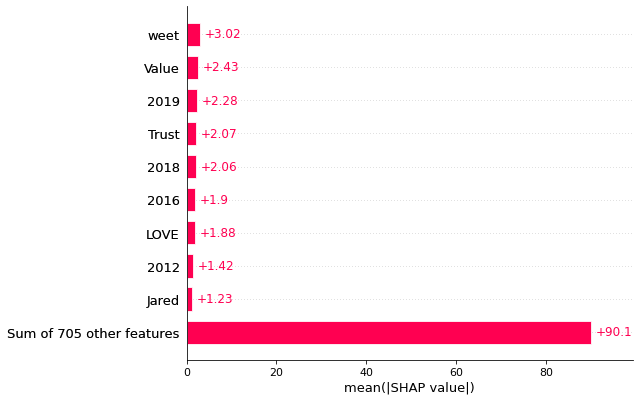

In [9]:
shap.plots.bar(shap_values.abs.mean(0))

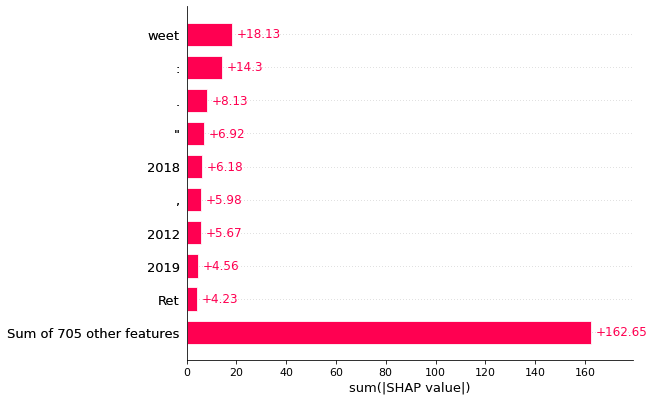

In [10]:
shap.plots.bar(shap_values.abs.sum(0))

In [7]:
tmp_df = data.sample(n=1000, replace=False, random_state=1)

In [16]:
tmp_df['text_proc'].values[:10]

array(['But they have Land...\n\nLocked out of aid, Zimbabwe begs IMF and World Bank for help  (via )',
       ' Millions',
       ':  So 120,000 people were involved in the coup and it still failed. Sad!',
       'Hitler &amp; Stalin, Gandhi &amp; MLK. These are easy cases. But many political heroes combine the awful &amp; the magnificent: Jefferson, Churchill, LBJ. How do we assess the statue test for those who are morally messy yet achieved the extraordinary? Honesty about the messiness is a start.',
       ": And this is why the #Kosovo teachers need to be protected from illegal extradition/ kidnapping. #Turkey's history of #to…",
       ': Twitter:\n\n- froze my ability to grow my account &amp; will not register new followers\n\n- deletes followers daily\n\n- deletes tweets…',
       'This is exactly what I have been warning about. MUST READ #Pakistan!\n\nThank you for lifting this !\n\n"The real point, to reiterate, is that India is not only a revisionist state, it is also an irr

In [13]:
# print(tmp_df['censored'].values, tmp_df['full_text_proc'].values)
shap_values = explainer(tmp_df['text_proc'].values.tolist())

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.
Partition explainer: 1001it [1:00:53,  3.66s/it]                          


In [14]:
with open('/nfs/turbo/coe-vvh/ljr/Censorship/shap/text_en_samp500.sav', 'wb') as f:
    explainer.save(f)

In [ ]:
with open('/nfs/turbo/coe-vvh/ljr/Censorship/shap/shap_vals_text_en_samp1000.pkl', 'wb') as f:
    pickle.dump(shap_values, f)


# Load shap_values

In [11]:
with open('/nfs/turbo/coe-vvh/ljr/Censorship/shap_data/shap_vals_text_en_samp1000.pkl', 'rb') as f:
    shap_values = pickle.load(f)

In [13]:
shap.plots.text(shap_values[5:10])

In [4]:
shap_values[3].data

array(['', 'Hit', 'ler ', '&', 'amp', '; ', 'Stalin', ', ', 'Gandhi ',
       '&', 'amp', '; ', 'ML', 'K', '. ', 'These ', 'are ', 'easy ',
       'cases', '. ', 'But ', 'many ', 'political ', 'heroes ',
       'combine ', 'the ', 'awful ', '&', 'amp', '; ', 'the ',
       'magnificent', ': ', 'Jefferson', ', ', 'Churchill', ', ', 'LB',
       'J', '. ', 'How ', 'do ', 'we ', 'assess ', 'the ', 'statue ',
       'test ', 'for ', 'those ', 'who ', 'are ', 'morally ', 'messy ',
       'yet ', 'achieved ', 'the ', 'extraordinary', '? ', 'Hon', 'esty ',
       'about ', 'the ', 'mess', 'iness ', 'is ', 'a ', 'start', '.', ''],
      dtype='<U13')

In [77]:
tmp_df['text_proc'].values[3]

'Hitler &amp; Stalin, Gandhi &amp; MLK. These are easy cases. But many political heroes combine the awful &amp; the magnificent: Jefferson, Churchill, LBJ. How do we assess the statue test for those who are morally messy yet achieved the extraordinary? Honesty about the messiness is a start.'

In [8]:
# tokenizer.convert_ids_to_tokens(tokenizer(tmp_df['text_proc'].values[3], add_special_tokens=False).input_ids)
import nltk
nltk.download('punkt')
from nltk.tokenize import word_tokenize
print(word_tokenize(tmp_df['text_proc'].values[3]))

['Hitler', '&', 'amp', ';', 'Stalin', ',', 'Gandhi', '&', 'amp', ';', 'MLK', '.', 'These', 'are', 'easy', 'cases', '.', 'But', 'many', 'political', 'heroes', 'combine', 'the', 'awful', '&', 'amp', ';', 'the', 'magnificent', ':', 'Jefferson', ',', 'Churchill', ',', 'LBJ', '.', 'How', 'do', 'we', 'assess', 'the', 'statue', 'test', 'for', 'those', 'who', 'are', 'morally', 'messy', 'yet', 'achieved', 'the', 'extraordinary', '?', 'Honesty', 'about', 'the', 'messiness', 'is', 'a', 'start', '.']


[nltk_data] Downloading package punkt to /home/ljrjerry/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [78]:
shap_values

.values =
array([array([ 1.08861399e-03, -1.85999057e-02, -1.13973403e-01, -1.82967197e-01,
               1.06393784e-01,  6.11960602e-01, -9.11655262e-02,  6.97548032e-02,
              -1.87168603e-01,  3.88819078e-02, -1.16643006e-01,  2.24178155e-01,
              -5.52021692e-02, -3.11878522e-01, -7.77961660e-01, -7.32552119e-01,
              -5.40755648e-01, -5.28437355e-02, -2.59762242e-02, -3.17181367e-01,
               1.52522116e-02,  9.02581727e-03, -2.96859387e-02, -3.67463008e-02,
              -6.72783713e-01, -2.58844457e-01,  1.71363354e-07])                ,
       array([ 2.09547579e-06, -1.91013498e+00, -7.41332769e-07]),
       array([-1.09896064e-07,  3.32242983e+00,  3.56363806e+00, -1.46010809e-01,
              -3.81109985e-01, -3.53215728e-02, -3.45339589e-02,  2.31329526e-01,
               2.47515148e-01, -5.32403144e-02, -1.68844045e-02, -1.44619818e-02,
              -6.24573775e-02,  1.36597669e+00, -2.02065136e-02, -2.76338898e-01,
              -1.742

In [83]:
[1,2,3,4][3:5]

[4]

In [21]:
from nltk.tokenize import word_tokenize
import copy
construct_shap_values = copy.deepcopy(shap_values)
for idx, sentence in enumerate(tmp_df['text_proc'].values[:4].tolist()):
    # each tweet
    word_list = word_tokenize(sentence)
    # print(word_list)
    # print(shap_values[idx].data)
    # print(shap_values[idx].values)
    word_list_idx = 0

    max_weight_list, max_token_list = [], []
    curr_token_idx_list = []
    token_appear_str = ''
    collected_empty_weight_list = []
    collected_empty_token_list = []
    
    for curr_token_idx, (value, data) in enumerate(zip(shap_values[idx].values, shap_values[idx].data)):
        # each shap_values token
        curr_token = data.strip()

        enter_next_loop = False
        while not enter_next_loop:
            if curr_token in word_list[word_list_idx] and (curr_token == '' or curr_token not in token_appear_str):
                if curr_token == '':
                    # if the space is at the beginning
                    if len(curr_token_idx_list) == 0:
                        max_weight_list.append(value)
                        max_token_list.append(data)
                    # if the space is at the end
                    else:
                        collected_empty_weight_list.append(value)
                        collected_empty_token_list.append(data)
                else:
                    curr_token_idx_list.append(curr_token_idx)
                    token_appear_str += curr_token
                    # print(curr_token)
                    
                enter_next_loop = True

            else:
                # print('datadatadata', data, len(curr_token_idx_list), curr_token)
                # print('datadata', token_appear_str)
                if len(curr_token_idx_list) == 0:
                    max_weight_list.append(value)
                    max_token_list.append(data)
                    enter_next_loop = True
                else:
                    max_weight = np.sum(shap_values[idx].values[curr_token_idx_list[0]:curr_token_idx_list[-1]+1])
                    max_token = word_list[word_list_idx]
                    max_weight_list.append(max_weight)
                    max_token_list.append(max_token)
                    # print('max_token: ', max_token)

                    token_appear_str = ''
                    word_list_idx += 1

                max_weight_list.extend(collected_empty_weight_list)
                max_token_list.extend(collected_empty_token_list)

                curr_token_idx_list = []
                collected_empty_weight_list = []
                collected_empty_token_list = []
        
        if curr_token_idx == len(shap_values[idx].values) - 1:
            if enter_next_loop:
                if len(curr_token_idx_list) == 0:
                    max_weight_list.append(value)
                    max_token_list.append(data)
                else:
                    max_weight = np.sum(shap_values[idx].values[curr_token_idx_list[0]:curr_token_idx_list[-1]+1])
                    max_token = word_list[word_list_idx]
                    max_weight_list.append(max_weight)
                    max_token_list.append(max_token)

                max_weight_list.extend(collected_empty_weight_list)
                max_token_list.extend(collected_empty_token_list)

    construct_shap_values[idx].values = max_weight_list
    construct_shap_values[idx].data = max_token_list
    # print(max_token_list)
    # print(construct_shap_values[idx].data)
    # print(construct_shap_values[idx].values)
    


['But', 'they', 'have', 'Land', '...', 'Locked', 'out', 'of', 'aid', ',', 'Zimbabwe', 'begs', 'IMF', 'and', 'World', 'Bank', 'for', 'help', '(', 'via', ')']
['' 'But ' 'they ' 'have ' 'Land' '...' '\n' '\n' 'L' 'ocked ' 'out '
 'of ' 'aid' ', ' 'Zimbabwe ' 'begs ' 'IMF ' 'and ' 'World ' 'Bank '
 'for ' 'help ' ' ' '(' 'via ' ')' '']
[ 1.08861399e-03 -1.85999057e-02 -1.13973403e-01 -1.82967197e-01
  1.06393784e-01  6.11960602e-01 -9.11655262e-02  6.97548032e-02
 -1.87168603e-01  3.88819078e-02 -1.16643006e-01  2.24178155e-01
 -5.52021692e-02 -3.11878522e-01 -7.77961660e-01 -7.32552119e-01
 -5.40755648e-01 -5.28437355e-02 -2.59762242e-02 -3.17181367e-01
  1.52522116e-02  9.02581727e-03 -2.96859387e-02 -3.67463008e-02
 -6.72783713e-01 -2.58844457e-01  1.71363354e-07]
['', 'But', 'they', 'have', 'Land', '...', '\n', '\n', 'Locked', 'out', 'of', 'aid', ',', 'Zimbabwe', 'begs', 'IMF', 'and', 'World', 'Bank', 'for', 'help', ' ', '(', 'via', ')', '']
['Millions']
[' ' 'Millions' '']
[ 2.095475

In [124]:
shap_values

.values =
array([array([ 1.08861399e-03, -1.85999057e-02, -1.13973403e-01, -1.82967197e-01,
               1.06393784e-01,  6.11960602e-01, -9.11655262e-02,  6.97548032e-02,
              -1.87168603e-01,  3.88819078e-02, -1.16643006e-01,  2.24178155e-01,
              -5.52021692e-02, -3.11878522e-01, -7.77961660e-01, -7.32552119e-01,
              -5.40755648e-01, -5.28437355e-02, -2.59762242e-02, -3.17181367e-01,
               1.52522116e-02,  9.02581727e-03, -2.96859387e-02, -3.67463008e-02,
              -6.72783713e-01, -2.58844457e-01,  1.71363354e-07])                ,
       array([ 2.09547579e-06, -1.91013498e+00, -7.41332769e-07]),
       array([-1.09896064e-07,  3.32242983e+00,  3.56363806e+00, -1.46010809e-01,
              -3.81109985e-01, -3.53215728e-02, -3.45339589e-02,  2.31329526e-01,
               2.47515148e-01, -5.32403144e-02, -1.68844045e-02, -1.44619818e-02,
              -6.24573775e-02,  1.36597669e+00, -2.02065136e-02, -2.76338898e-01,
              -1.742

In [113]:
construct_shap_values[0].values = [1]

In [120]:
construct_shap_values[0]._s.values = [1]

In [ ]:
!pip install slicer

In [127]:
construct_shap_values.values(np.array([1]))

TypeError: 'numpy.ndarray' object is not callable

In [128]:
construct_shap_values.values = np.array([1])

In [129]:
construct_shap_values

.values =
array([1])

.base_values =
array([-0.67167717,  0.08839682, -0.63154066, -0.94362783, -0.72735959,
       -0.79352003, -0.94469643, -0.49462485, -0.67229235, -0.88366687,
       -0.67167717, -0.36739284, -0.72735959, -0.89174342, -0.9184497 ,
       -0.67167717, -0.79352003, -0.9036327 , -0.57929325, -0.39214423,
       -0.79078007, -0.88516998, -0.79487461, -0.94827765, -0.91688704,
       -0.79078007, -0.80580556, -0.49462485, -0.60944772, -0.63154066,
       -0.80580556, -0.44102615, -0.88366687, -0.80580556, -1.07633626,
       -0.39214423, -0.88366687, -0.89871722, -0.82991749, -0.79078007,
       -0.66568613, -0.77908701, -0.44102615, -0.71356541, -0.60944772,
       -0.84401625, -0.36739284, -0.80580556, -0.67167717, -0.67167717,
       -0.71356541, -0.77908701, -0.23045418, -0.92000282, -0.41068026,
       -0.57929325, -0.79487461, -0.65832734, -0.97777832, -0.88713664,
       -0.33198735, -0.92000282, -0.67167717, -0.66856623, -0.88713664,
       -0.82991749, -0.2717

In [122]:
from slicer import Slicer
construct_shap_values[0]._s = Slicer(
    data=[1],
    values=[2]
)

In [23]:
np.sum(construct_shap_values[0].values)

-3.4463934302330017

In [24]:
construct_shap_values[0]

.values =
array([ 1.08861399e-03, -1.85999057e-02, -1.13973403e-01, -1.82967197e-01,
        1.06393784e-01,  6.11960602e-01, -9.11655262e-02,  6.97548032e-02,
       -1.87168603e-01,  3.88819078e-02, -1.16643006e-01,  2.24178155e-01,
       -5.52021692e-02, -3.11878522e-01, -7.77961660e-01, -7.32552119e-01,
       -5.40755648e-01, -5.28437355e-02, -2.59762242e-02, -3.17181367e-01,
        1.52522116e-02,  9.02581727e-03, -2.96859387e-02, -3.67463008e-02,
       -6.72783713e-01, -2.58844457e-01,  1.71363354e-07])

.base_values =
-0.6716771721839905

.data =
array(['', 'But ', 'they ', 'have ', 'Land', '...', '\n', '\n', 'L',
       'ocked ', 'out ', 'of ', 'aid', ', ', 'Zimbabwe ', 'begs ', 'IMF ',
       'and ', 'World ', 'Bank ', 'for ', 'help ', ' ', '(', 'via ', ')',
       ''], dtype='<U9')

In [86]:
curr_token_idx_list

[]

In [60]:
shap_values.__dict__.keys()

dict_keys(['op_history', 'compute_time', 'output_dims', '_s'])

In [63]:
shap_values._s.__dict__.keys()

dict_keys(['_max_dim', '_anon', '_objects', '_aliases', '_alias_lookup', 'o', 'values', 'base_values', 'data', 'display_data', 'instance_names', 'feature_names', 'output_names', 'output_indexes', 'lower_bounds', 'upper_bounds', 'error_std', 'main_effects', 'hierarchical_values', 'clustering'])

In [ ]:
shap_values._s._objects['feature_names'].dim

# Visualize shap_values

In [47]:
shap_values

.values =
array([array([ 1.08861399e-03, -1.85999057e-02, -1.13973403e-01, -1.82967197e-01,
               1.06393784e-01,  6.11960602e-01, -9.11655262e-02,  6.97548032e-02,
              -1.87168603e-01,  3.88819078e-02, -1.16643006e-01,  2.24178155e-01,
              -5.52021692e-02, -3.11878522e-01, -7.77961660e-01, -7.32552119e-01,
              -5.40755648e-01, -5.28437355e-02, -2.59762242e-02, -3.17181367e-01,
               1.52522116e-02,  9.02581727e-03, -2.96859387e-02, -3.67463008e-02,
              -6.72783713e-01, -2.58844457e-01,  1.71363354e-07])                ,
       array([ 2.09547579e-06, -1.91013498e+00, -7.41332769e-07]),
       array([-1.09896064e-07,  3.32242983e+00,  3.56363806e+00, -1.46010809e-01,
              -3.81109985e-01, -3.53215728e-02, -3.45339589e-02,  2.31329526e-01,
               2.47515148e-01, -5.32403144e-02, -1.68844045e-02, -1.44619818e-02,
              -6.24573775e-02,  1.36597669e+00, -2.02065136e-02, -2.76338898e-01,
              -1.742

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


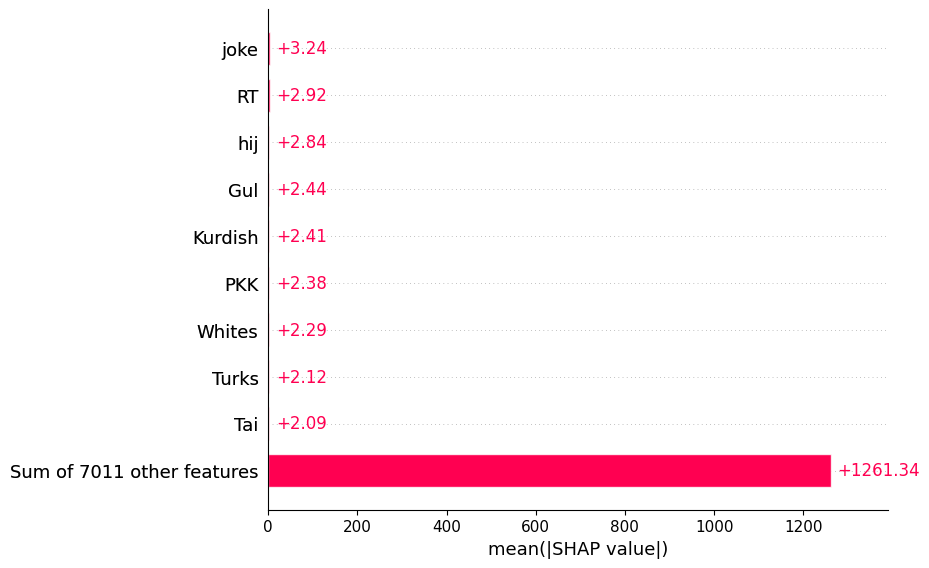

In [7]:
shap.plots.bar(shap_values.abs.mean(0))

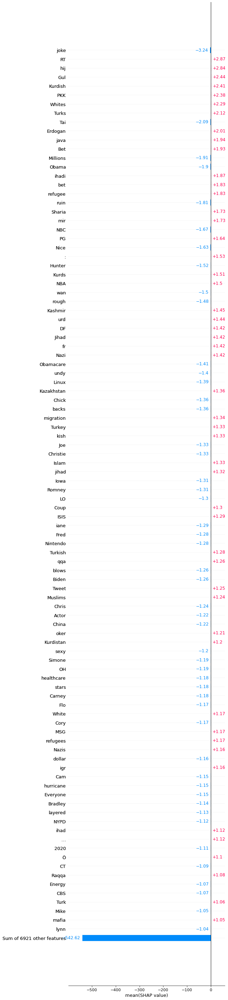

In [18]:
shap.plots.bar(shap_values.mean(0), max_display=100)

In [21]:
shap.plots.text(shap_values[50:55])

In [23]:
explainer

# Shapley

In [3]:
# # load the model and tokenizer
# tokenizer = transformers.AutoTokenizer.from_pretrained("roberta-base")
# model = transformers.AutoModelForSequenceClassification.from_pretrained("roberta-base")

# # build a pipeline object to do predictions
# pred = transformers.pipeline("text-classification", model=model, tokenizer=tokenizer, return_all_scores=True)

# model.load_state_dict(torch.load('/nfs/turbo/coe-vvh/ljr/Censorship/models/20230218-03:07:30_binary_0.1_8_1e-05_adamw.pt'))

# explainer = shap.Explainer(pred)

data = pd.read_csv('/nfs/turbo/coe-vvh/ljr/Censorship/data/dataset_test.csv', engine='python')

In [4]:
curr_data = select_df(data, lang='en', withheld=None)

  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer:  10%|█         | 1/10 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer:  30%|███       | 3/10 [00:56<01:21, 11.65s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer:  40%|████      | 4/10 [01:23<01:49, 18.27s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer:  50%|█████     | 5/10 [01:45<01:38, 19.69s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer:  60%|██████    | 6/10 [02:09<01:24, 21.02s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer:  70%|███████   | 7/10 [02:47<01:19, 26.61s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer:  80%|████████  | 8/10 [03:10<00:50, 25.41s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer:  90%|█████████ | 9/10 [03:33<00:24, 24.91s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


Partition explainer: 100%|██████████| 10/10 [03:57<00:00, 24.37s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

Partition explainer: 11it [04:19, 25.92s/it]                        
Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


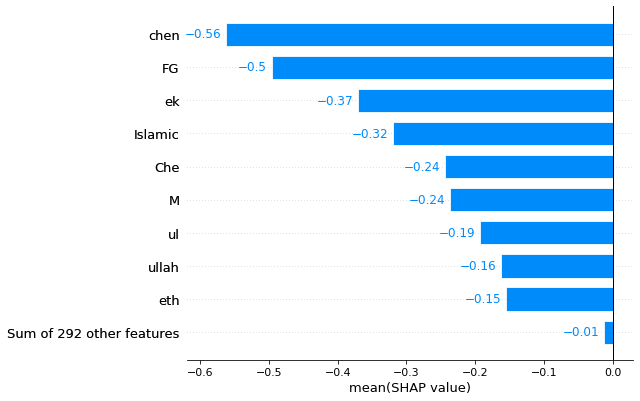

In [3]:
shap_values = explainer(data['text'].values[:10].tolist())

shap.plots.bar(shap_values[:,:,0].mean(0), order=shap.Explanation.argsort)

# TransSHAP

In [33]:
from transformers import BertTokenizer, BertForSequenceClassification
import numpy as np
import pandas as pd
from nltk.tokenize import TweetTokenizer
import random
import logging
np.random.seed(0)
logging.basicConfig(format='%(asctime)s - %(message)s', datefmt='%d-%b-%y %H:%M:%S')
logging.getLogger().setLevel(logging.INFO)

class SCForShap(transformers.AutoModelForSequenceClassification):
    def __init__(self, config):
        super().__init__(config)
    def forward(self, input_ids=None, attention_mask=None, token_type_ids=None, position_ids=None, head_mask=None, inputs_embeds=None, labels=None,):
        output = super().forward(input_ids, attention_mask, token_type_ids, position_ids, head_mask, inputs_embeds, labels)
        return output[0]

# Load pre-trained model tokenizer
pretrained_model = "roberta-base"
tokenizer = transformers.AutoTokenizer.from_pretrained("roberta-base")
model = SCForShap.from_pretrained("roberta-base")

model.load_state_dict(torch.load('/nfs/turbo/coe-vvh/ljr/Censorship/models/20230218-03:07:30_binary_0.1_8_1e-05_adamw.pt'))

# Test texts
tmp_data = np.random.choice(curr_data['full_text_proc'].values, 10)
np.random.choice(curr_data['censored'].values, 10)

Some weights of the model checkpoint at roberta-base were not used when initializing RobertaForSequenceClassification: ['lm_head.bias', 'lm_head.layer_norm.weight', 'roberta.pooler.dense.weight', 'lm_head.dense.weight', 'lm_head.layer_norm.bias', 'lm_head.dense.bias', 'lm_head.decoder.weight', 'roberta.pooler.dense.bias']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.out_proj.weight', 'classi

array([0, 1, 0, 1, 1, 0, 0, 0, 0, 1])

In [25]:
tmp_data

array(["User ID: @Variety. Description: The business of entertainment. Time of the tweet: Jan 2020. Tweet: Is captioning this 'f--k off' appropriate? #Succession's Brian Cox arrives to the #GoldenGlobes ",
       'User ID: @JuliaHB1. Description: Presenter @talkTV Breakfast Show 6.30am-10am Mon-Thurs. DAB+, app or https://t.co/ziGPcSzIm1. Journalist, broadcaster, speaker, event host & woman without a penis Time of the tweet: Mar 2020. Tweet: Quoted: It is immoral and wrong for Prince Charles to have used a coronavirus test when he has only mild symptoms &amp; they are scarce. No one else would be eligible for such a test with mild symptoms. That test could have been better used by a frontline NHS worker or supermarket worker.  "Prince of Wales, 71, tests positive for coronavirus and has mild symptoms "but otherwise remains in good health" ',
       'User ID: @___Colb___. Description: Social Media Producer at @SBNation and @vox_union member. #Elite Time of the tweet: Jan 2020. Tweet: La

## TransSHAP -- LIME

In [14]:
!pip install lime

Defaulting to user installation because normal site-packages is not writeable
ERROR: Could not find a version that satisfies the requirement explainers (from versions: none)
ERROR: No matching distribution found for explainers


In [25]:
tmp_data = data['text_proc'].values[50:55]
data['censored'].values[:5]

array([0, 1, 1, 0, 1])

In [27]:
from lime.lime_text import LimeTextExplainer
from TransSHAP.explainers.LIME_for_text import LIMExplainer
import logging

predictor = LIMExplainer(model, tokenizer)
label_names = ["Uncensored", "Censored"]
explainer = LimeTextExplainer(class_names=label_names, split_expression=predictor.split_string)

to_use = tmp_data
for i, example in enumerate(to_use):
    logging.info(f"Example {i+1}/{len(to_use)} start")
    temp = predictor.split_string(example)
    exp = explainer.explain_instance(text_instance=example, classifier_fn=predictor.predict, num_features=len(temp))
    logging.info(f"Example {i + 1}/{len(to_use)} done")
    words = exp.as_list()
    #sum_ = 0.6
    #exp.local_exp = {x: [(xx, yy / (sum(hh for _, hh in exp.local_exp[x])/sum_)) for xx, yy in exp.local_exp[x]] for x in exp.local_exp}
    exp.show_in_notebook(text=True, labels=(exp.available_labels()[0],))

19-Feb-23 14:39:16 - Example 1/5 start
19-Feb-23 14:40:40 - Example 1/5 done


19-Feb-23 14:40:40 - Example 2/5 start
19-Feb-23 14:43:09 - Example 2/5 done


19-Feb-23 14:43:09 - Example 3/5 start
19-Feb-23 14:45:35 - Example 3/5 done


19-Feb-23 14:45:35 - Example 4/5 start
19-Feb-23 14:46:12 - Example 4/5 done


19-Feb-23 14:46:12 - Example 5/5 start
19-Feb-23 14:46:53 - Example 5/5 done


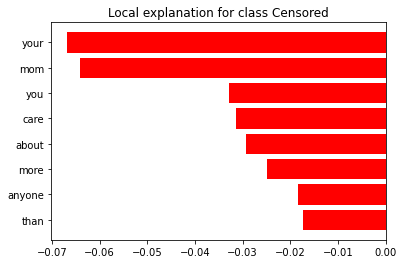

In [28]:
%matplotlib inline
fig = exp.as_pyplot_figure()

## TransSHAP -- Shap

In [30]:
# Bag of words (vocabulary)
train_data = curr_data['full_text_proc'].values.tolist()
tknzr = TweetTokenizer()
bag_of_words = set([xx for x in train_data for xx in tknzr.tokenize(x)])

In [36]:
tmp_data = curr_data['full_text_proc'].values[:5]
curr_data['censored'].values[:5]

array([0, 1, 1, 0, 1])

In [ ]:
import shap
from TransSHAP.explainers.SHAP_for_text import SHAPexplainer
logging.getLogger("shap").setLevel(logging.WARNING)
shap.initjs()

words_dict = {0: None}
words_dict_reverse = {None: 0}
for h, hh in enumerate(bag_of_words):
    words_dict[h + 1] = hh
    words_dict_reverse[hh] = h + 1

predictor = SHAPexplainer(model, tokenizer, words_dict, words_dict_reverse)
train_dt = np.array([predictor.split_string(x) for x in np.array(train_data)])
idx_train_data, max_seq_len = predictor.dt_to_idx(train_dt)

explainer = shap.KernelExplainer(model=predictor.predict, data=shap.kmeans(idx_train_data, k=50))

texts_ = [predictor.split_string(x) for x in tmp_data]
idx_texts, _ = predictor.dt_to_idx(texts_, max_seq_len=max_seq_len)

to_use = idx_texts[-1:]
shap_values = explainer.shap_values(X=to_use, nsamples=64, l1_reg="aic")

len_ = len(texts_[-1:][0])
d = {i: sum(x > 0 for x in shap_values[i][0, :len_]) for i, x in enumerate(shap_values)}
m = max(d, key=d.get)
print(" ".join(texts_[-1:][0]))
shap.force_plot(explainer.expected_value[m], shap_values[m][0, :len_], texts_[-1:][0])

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


  0%|          | 0/1 [00:00<?, ?it/s]